# Background subtraction

If you have a video of a steady scene with some objects moving around, it's possible to separate a still background from a changing foreground. Here, we will show you how to do it in OpenCV.

All background subtractors implement the `cv2.BackgroundSubtractor` interface, therefore all of them have a certain set of methods:
* `cv2.BackgroundSubtractor.apply`: to get the segmentation mask 
* `cv2.BackgroundSubtractor.getBackgroundImage`: to retrieve a background image

The `apply` method accepts a colorful image as an argument and returns a background mask. This mask generally consists of three values: `0` for background pixels, `255` for foreground pixels, and `127` for shadow pixels. Shadow pixels are pixels in the background with lower intensity. It's worth mentioning that not all subtractors support analysis of shadow pixels.

`getBackgroundImage` returns a background image as it should be if there are no moving objects. Again, only a few subtractors are able to compute such an image.

Not surprisingly, all of the subtraction algorithms have internal parameters. Fortunately, many of these parameters work well with default values. One of the parameters, which can be tuned first, is history. Basically, it's a number of frames the subtractor needs to analyse before it starts to produce a segmentation mask. So, usually you get full background masks for first frames.

As you've noticed, we apply morphology operations to the moving objects masks. We need this step for to several reasons. First, some parts of the moving objects may have poor textures. This makes it harder to detect motion because all neighbor pixels are very similar. The second reason is our background segmentation detector isn't as accurate as we want. It makes mistakes by wrongly marking parts of moving objects as a background. Applying morphology helps us use prior information which can't be still parts inside moving objects.

In [1]:
# Import all of the necessary modules
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os

%matplotlib auto
%pylab inline

def print_image(header,name,np_arr,
                start_First=0,end_First=1,start_Second=0,end_Second=2,start_3=0,end_3=5):
    print("------  {0:-<25}    Shape{1} {2}: {3:}".format(header, np_arr.shape, name, str(np_arr.dtype)) )
    shapes = np_arr.shape #print(shapes)
    if shapes[0] < end_First:
        end_First = shapes[0]
    if shapes[1] < end_Second:
        end_Second = shapes[1]
    if len(shapes)==3:
        if shapes[2] < end_3:
            end_3 = shapes[2]
    if len(shapes)==3:
        for i in range (start_First,end_First):
            print("[", sep='',end="")
            for j in range (start_Second,end_Second):
                print(np_arr[i,j,start_3:end_3], sep=' ', end=" ")
            print(']')
    if len(shapes)==2:
        for i in range (start_First,end_First):
            print("[", end=" ")
            #print(np_arr[i,start_Second:end_Second],sep=' ',end=" ") cutoff sting by<60
            for k in range (start_Second,end_Second):
                print(np_arr[i,k], end=" ")
            print(']')

def draw_grid(img, pxystep=None,major_color=None, pxstep=None,pystep=None):
    #print("{0} XY{1} color{2} X{3} Y{4}".format(img.shape, pxystep,major_color,pxstep,pystep))
    pXYstep = None; pXstep=None; pYstep=None; 
    major_Color=None; minor_Color=None; major_Alpha=None; minor_Alpha=None;
    if pxystep != None:
        pXYstep = pXstep = pYstep = pxystep;
    else:
        pXstep = pxstep if pxstep != None else 100
        pYstep = pystep if pystep != None else 100
    major_Color = major_color if major_color != None else (204, 204, 204) #'#CCCCCC'
    if pXstep != None:
        x = pXstep
        #Draw all lines on X
        while x < img.shape[1]:
            cv2.line(img, (x, 0), (x, img.shape[0]), color=major_Color, thickness=1)
            x += pXstep
    if pYstep != None:
        y = pYstep
        #Draw all lines on Y
        while y < img.shape[0]:
            cv2.line(img, (0, y), (img.shape[1], y), color=major_Color,thickness=1)
            y += pYstep
    return img

def plt_view_image(plt,list_images,figsize=(15,6), axis="off", cmap='gray'):
    plt.figure(figsize=figsize)
    n = len(list_images)  #; print(n)
    plot_number = 1
    for name, img in list_images:
        plt.subplot(1,n,plot_number)
        plt.axis(axis); plt.title(name)
        if cmap =='gray': plt.imshow(img,cmap='gray' )
        else: plt.imshow(img)
        plot_number = plot_number + 1
    plt.show()

def plt_view_grid(plt, axis ='off',
                  xy_sizeaxis =None,
                  xy_measuare =None,
                  x_min=-10, x_max=10, y_min=-10, y_max=10,
                  x_major_size=1, x_minor_size=0.2, y_major_size=1, y_minor_size=0.2,
                  major_color='#CCCCCC', major_alpha=0.5,
                  minor_color='#CCCCCC', minor_alpha=0.2
                 ):
    if xy_sizeaxis is None:  x_min=-10; x_max=10; y_min=-10; y_max=10;
    else: x_min, x_max, y_min, y_max = xy_sizeaxis

    if xy_measuare is None:  x_major_size=1; x_minor_size=0.2; y_major_size=1; y_minor_size=0.2;
    else: x_major_size, x_minor_size, y_major_size, y_minor_size = xy_measuare
        
    plt.xlim(x_min, x_max); plt.ylim(y_min, y_max);
    ax = plt.gca()
    x_major_ticks=np.arange(x_min,x_max,x_major_size); x_minor_ticks=np.arange(x_min,x_max,x_minor_size)
    y_major_ticks=np.arange(y_min,y_max,y_major_size); y_minor_ticks=np.arange(y_min,y_max,y_minor_size)
    ax.set_xticks(x_major_ticks)
    ax.xaxis.set_major_locator(MultipleLocator(x_major_size))
    ax.set_xticks(x_minor_ticks, minor=True)
    ax.set_yticks(y_major_ticks)
    ax.yaxis.set_major_locator(MultipleLocator(y_major_size))
    ax.set_yticks(y_minor_ticks, minor=True)
    plt.grid(which='major', color=major_color, alpha=major_alpha)
    plt.grid(which='minor', color=minor_color, alpha=minor_alpha)
    
#help("modules")   
import sys             
print('\n'.join(sys.path))
print("current folder ==",os.getcwd())
#pip list

Using matplotlib backend: TkAgg
Populating the interactive namespace from numpy and matplotlib
D:\HTML_DOC\Program\opencv\Packt\S08\env
C:\Program Files\Python38\python38.zip
C:\Program Files\Python38\DLLs
C:\Program Files\Python38\lib
C:\Program Files\Python38
d:\html_doc\program\opencv\packt\s08\env

d:\html_doc\program\opencv\packt\s08\env\lib\site-packages
d:\html_doc\program\opencv\packt\s08\env\lib\site-packages\pip-20.1b1-py3.8.egg
d:\html_doc\program\opencv\packt\s08\env\lib\site-packages\win32
d:\html_doc\program\opencv\packt\s08\env\lib\site-packages\win32\lib
d:\html_doc\program\opencv\packt\s08\env\lib\site-packages\Pythonwin
d:\html_doc\program\opencv\packt\s08\env\lib\site-packages\IPython\extensions
C:\Users\polit\.ipython
current folder == D:\HTML_DOC\Program\opencv\Packt\S08\env


In [2]:
path="../data/traffic.mp4"
video = cv2.VideoCapture(path)
print('Created capture:', path)
print('Frame count:', int(video.get(cv2.CAP_PROP_FRAME_COUNT)))
print('Frame width:', int(video.get(cv2.CAP_PROP_FRAME_WIDTH)))
print('Frame height:', int(video.get(cv2.CAP_PROP_FRAME_HEIGHT)))
print('Frame rate:',video.get(cv2.CAP_PROP_FPS))


def split_image_fgbg(subtractor, image_frames, path = path,
                     open_sz=(0,0), close_sz=(0,0), show_bg=False, show_shdw=False):
    kernel_open = kernel_close = None
    
    if all(i > 0 for i in open_sz):
        kernel_open = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, open_sz)
    
    if all(i > 0 for i in close_sz):
        kernel_close = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, close_sz)

    cap = cv2.VideoCapture(path)
    
    c = 0
    while True:
        status_cap, frame = cap.read()
        if not status_cap:
            break
        
        frame = cv2.resize(frame, None, fx=0.5, fy=0.5)
        fgmask = subtractor.apply(frame)
        
        objects_mask = (fgmask == 255).astype(np.uint8)
        shadows_mask = (fgmask == 127).astype(np.uint8)
            
        if kernel_open is not None:
            objects_mask = cv2.morphologyEx(objects_mask, cv2.MORPH_OPEN, kernel_open)
        if kernel_close is not None:
            objects_mask = cv2.morphologyEx(objects_mask, cv2.MORPH_CLOSE, kernel_close)
            if kernel_open is not None:
                shadows_mask = cv2.morphologyEx(shadows_mask, cv2.MORPH_CLOSE, kernel_open)
                         
        foreground = frame
        foreground[objects_mask == 0] = 0
        
        if show_shdw:
            foreground[shadows_mask > 0] = (0, 255, 0)
        cv2.imshow('foreground', foreground)

        if show_bg:
            background = fgbg.getBackgroundImage()
            if background is not None:
                cv2.imshow('background', background)    

        c += 1
        if c % 100 == 0 or c ==1:
            image_frames.append(["foreground:{0}".format(c),foreground[:,:,[2,1,0]]])
            if show_bg:
                if len(background.shape) >2:
                    image_frames.append(["background:{0}".format(c),background[:,:,[2,1,0]]])
                else:
                    image_frames.append(["background:{0}".format(c),background])
        if cv2.waitKey(1) == 27:
            break

    cap.release()
    cv2.destroyAllWindows()

Created capture: ../data/traffic.mp4
Frame count: 1501
Frame width: 1920
Frame height: 1080
Frame rate: 25.0


### Apply the Gaussian Mixture-based Background/Foreground Segmentation Algorithm created by KadewTraKuPong and Bowden to the video:

createBackgroundSubtractorMOG == 16
0 1


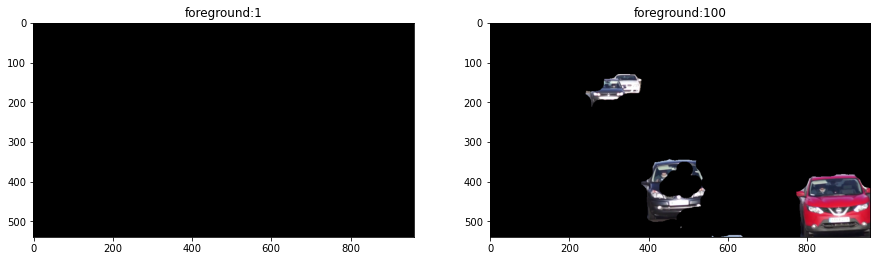

2 3


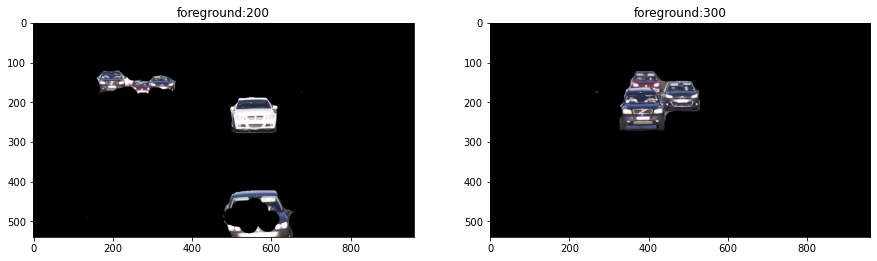

4 5


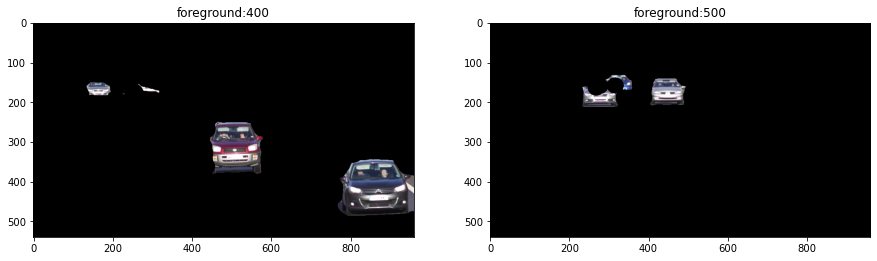

6 7


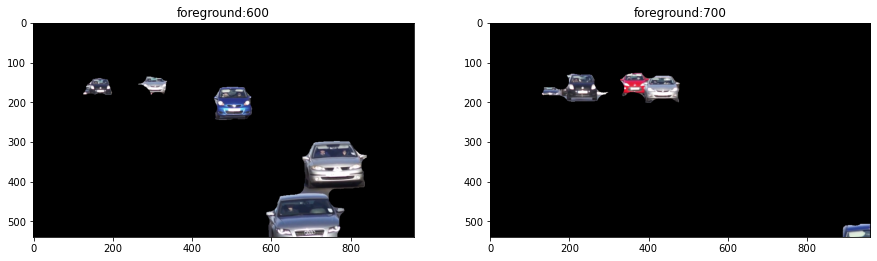

8 9


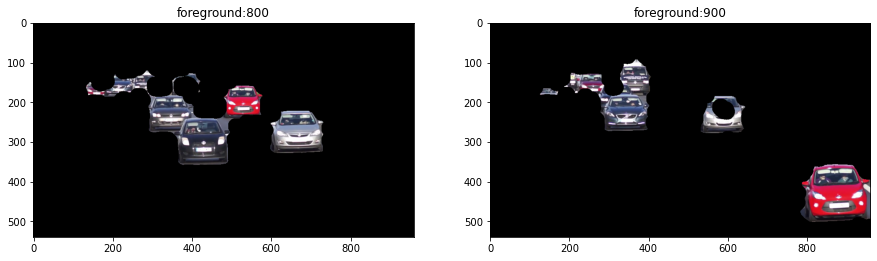

10 11


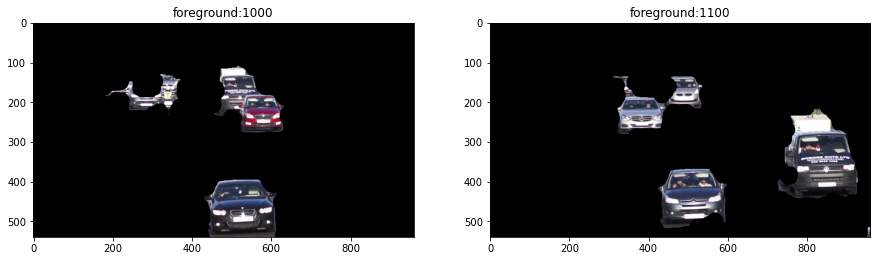

12 13


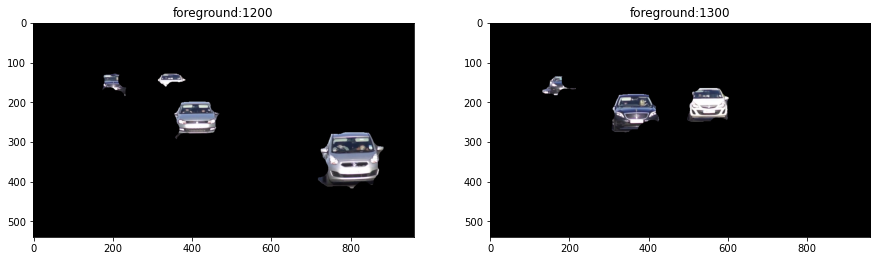

14 15


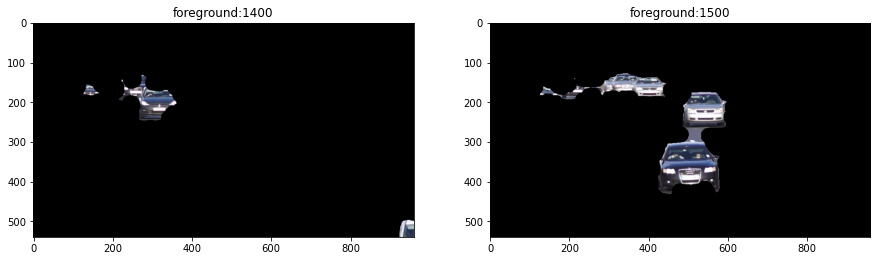

In [3]:
fgbg = cv2.bgsegm.createBackgroundSubtractorMOG()

image_frames = []
split_image_fgbg(fgbg, image_frames, "../data/traffic.mp4", (2,2), (40,40))



########################################################
print("createBackgroundSubtractorMOG ==", len(image_frames))
k = 2
for i in range(0,len(image_frames),k):
    print(i,i+k-1)
    plt_view_image(plt,image_frames[i:i+k], figsize=(15,8), axis='on', cmap='gray')

### Create an instance of an improved version of the Gaussian Mixture segmentation algorithm developed by Zoran Zivkovic:

createBackgroundSubtractorMOG2 == 32
0 1


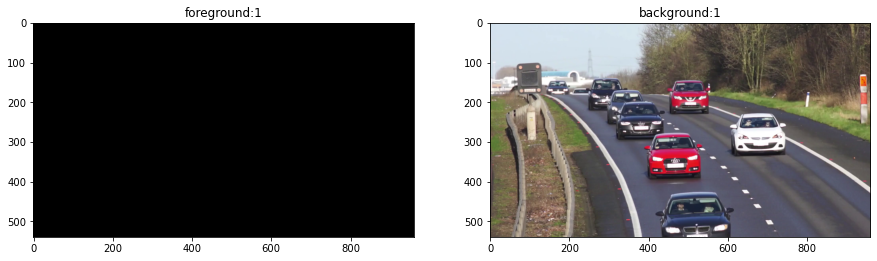

2 3


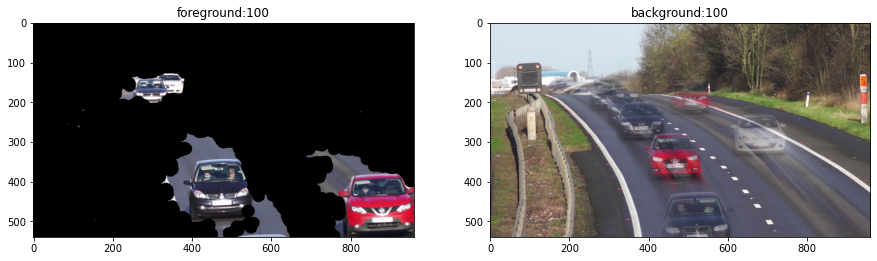

4 5


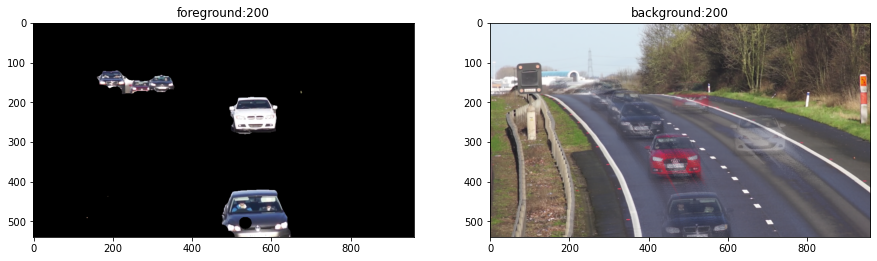

6 7


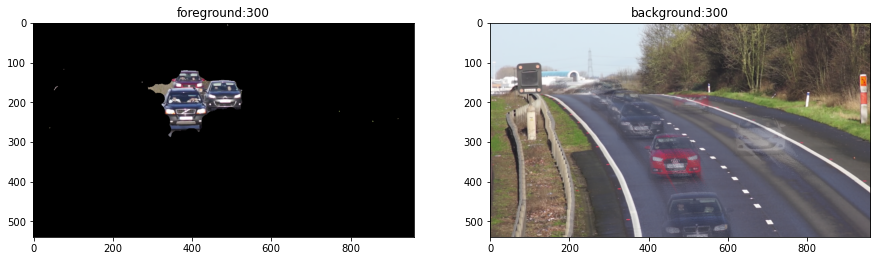

8 9


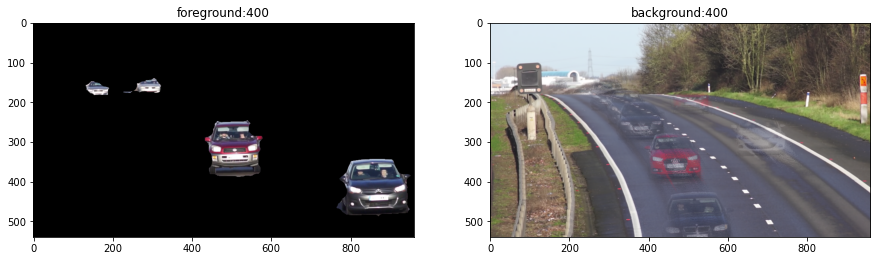

10 11


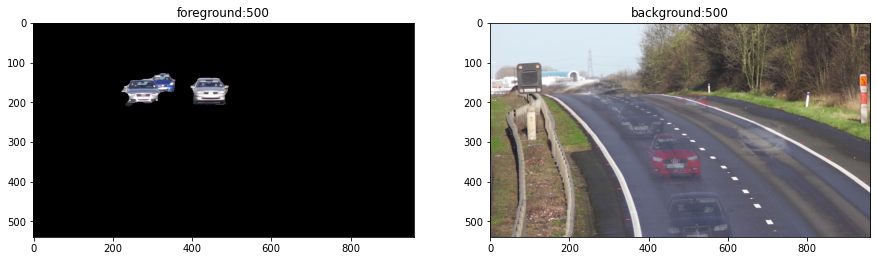

12 13


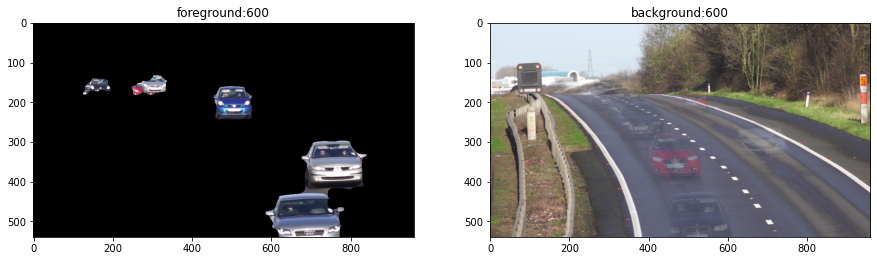

14 15


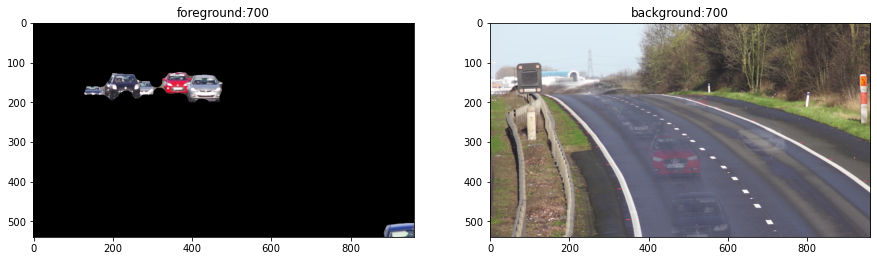

16 17


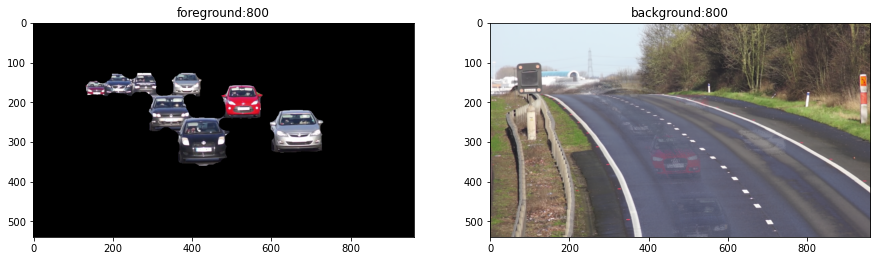

18 19


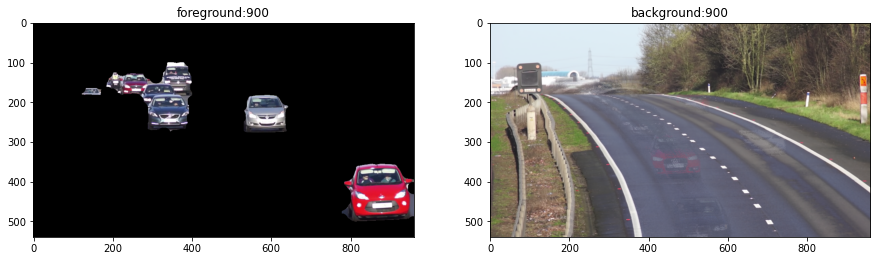

20 21


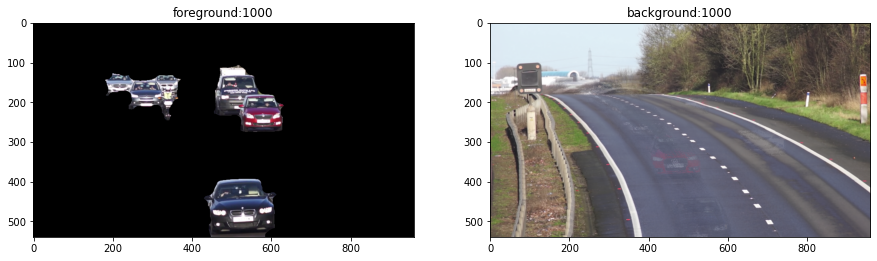

22 23


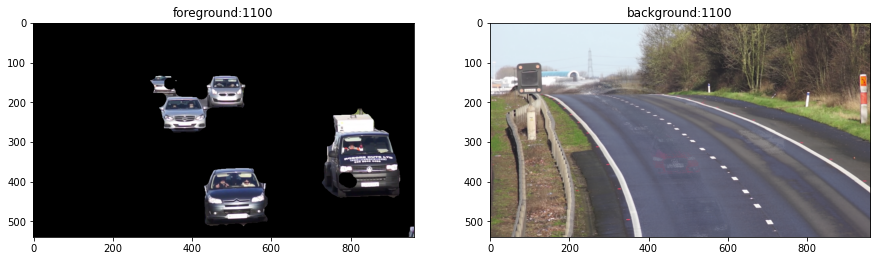

24 25


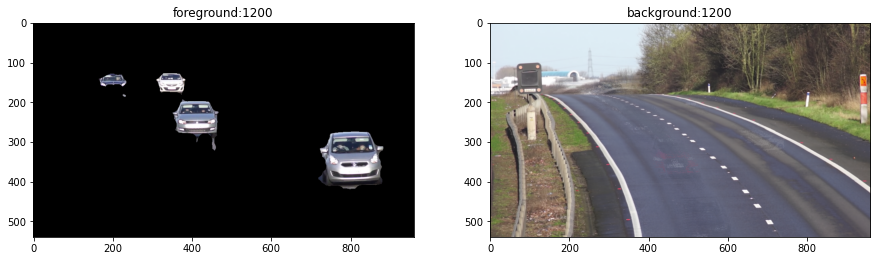

26 27


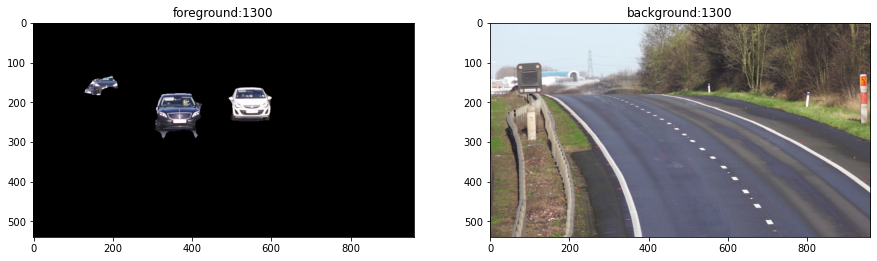

28 29


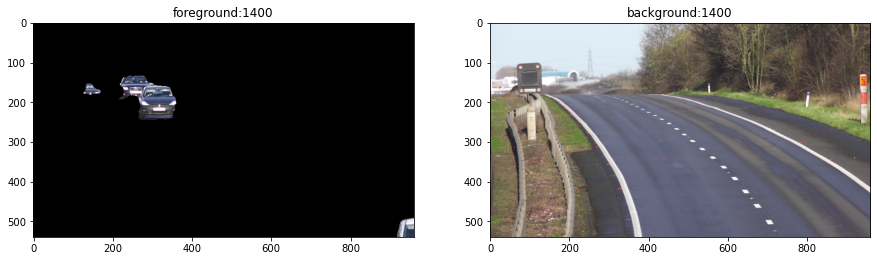

30 31


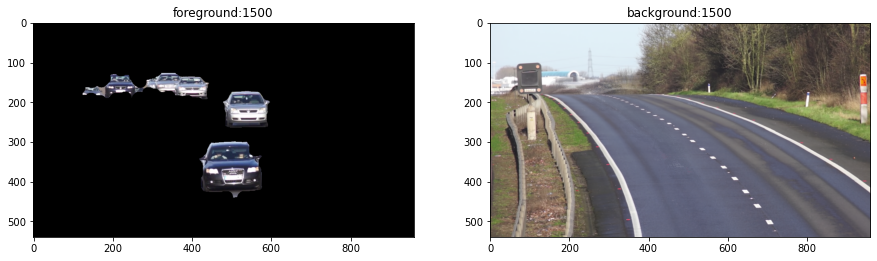

In [4]:
fgbg = cv2.createBackgroundSubtractorMOG2()

image_frames = []
split_image_fgbg(fgbg, image_frames, "../data/traffic.mp4", (3,3), (30,30), True)



########################################################
print("createBackgroundSubtractorMOG2 ==", len(image_frames))
k = 2
for i in range(0,len(image_frames),k):
    print(i,i+k-1)
    plt_view_image(plt,image_frames[i:i+k], figsize=(15,8), axis='on', cmap='gray')

### Use the background subtraction algorithm of Godbehere, Matsukawa, and Goldberg to create background masks:

createBackgroundSubtractorGMG == 16
0 1


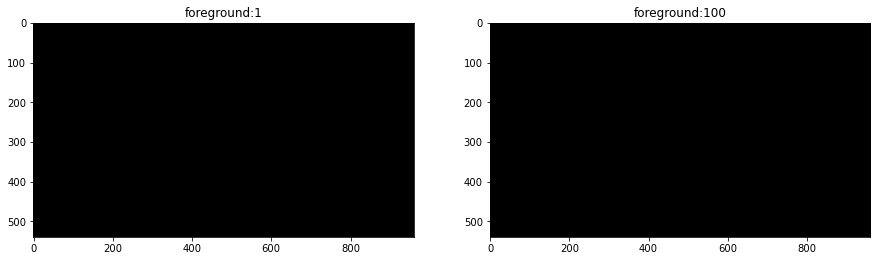

2 3


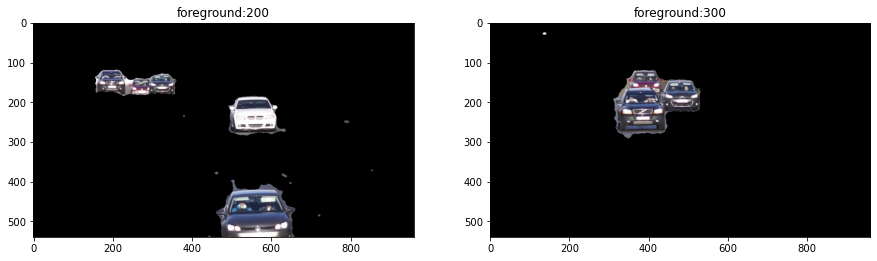

4 5


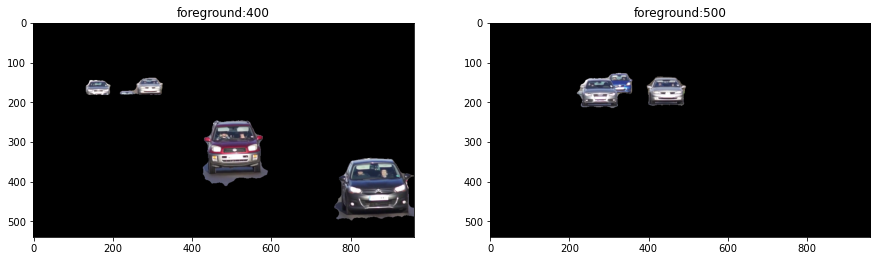

6 7


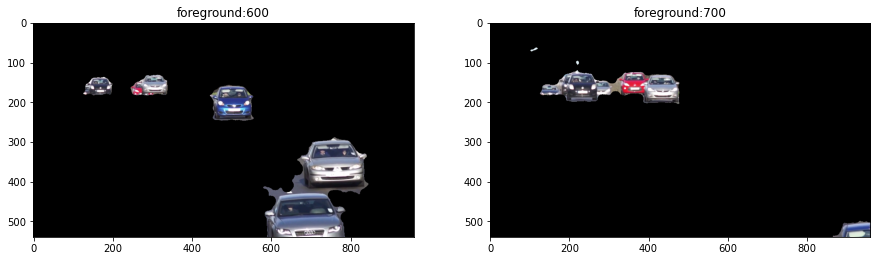

8 9


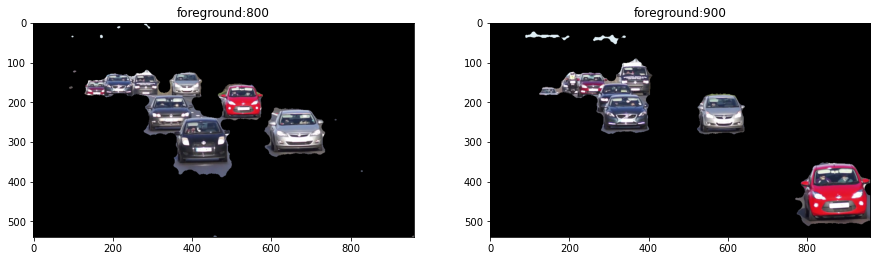

10 11


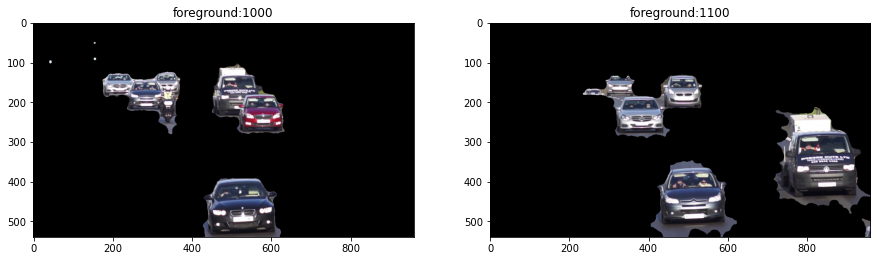

12 13


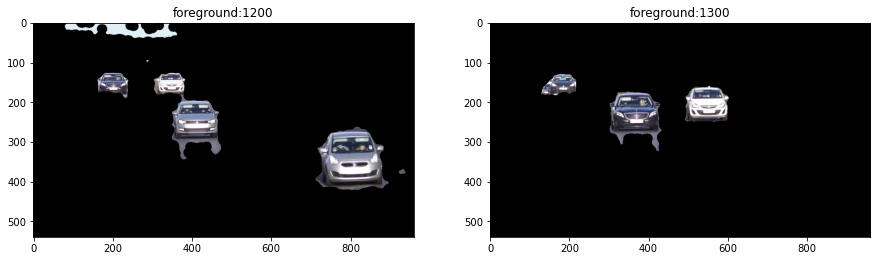

14 15


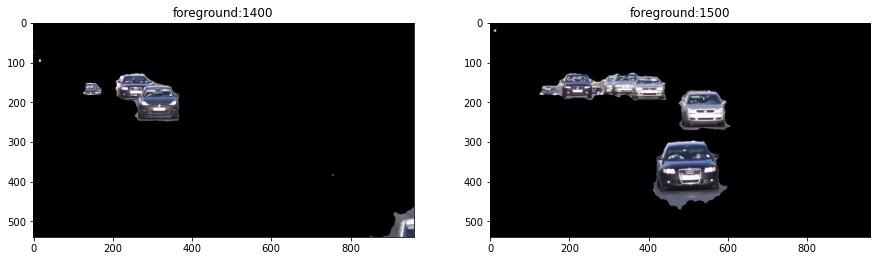

In [5]:
fgbg = cv2.bgsegm.createBackgroundSubtractorGMG()

image_frames = []
split_image_fgbg(fgbg, image_frames, "../data/traffic.mp4", (5,5), (25,25))



########################################################
print("createBackgroundSubtractorGMG ==", len(image_frames))
k = 2
for i in range(0,len(image_frames),k):
    print(i,i+k-1)
    plt_view_image(plt,image_frames[i:i+k], figsize=(15,8), axis='on', cmap='gray')

###  Apply the background subtraction algorithm based on counting, as suggested by Sagi Zeevi:

createBackgroundSubtractorCNT == 32
0 1


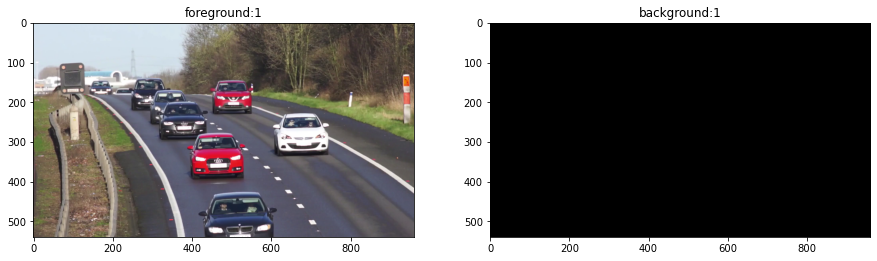

2 3


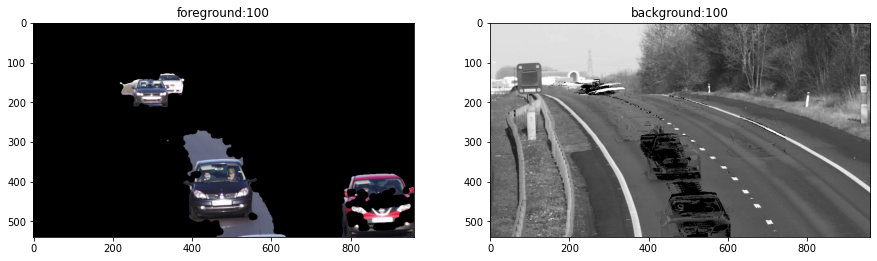

4 5


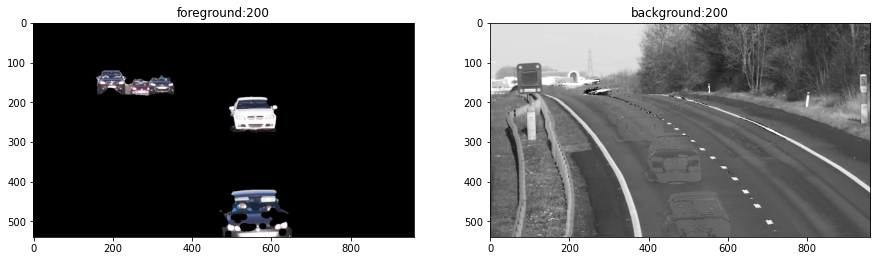

6 7


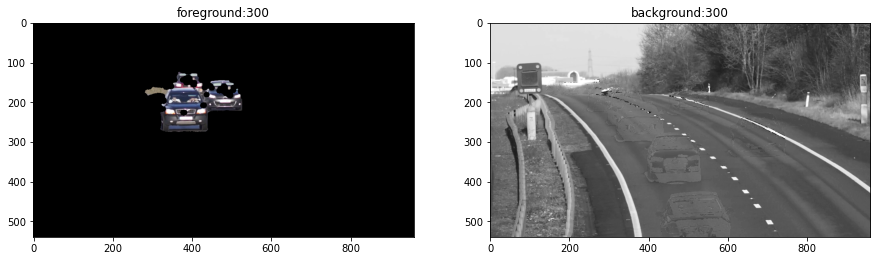

8 9


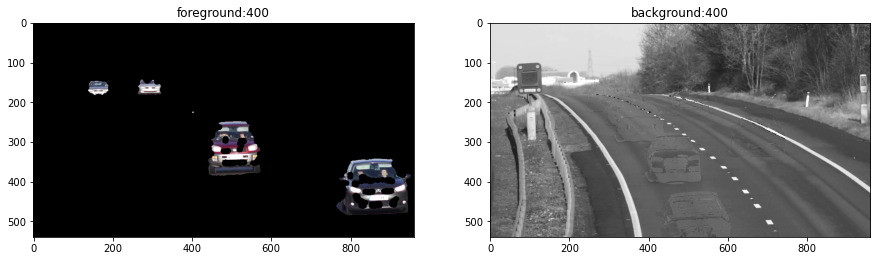

10 11


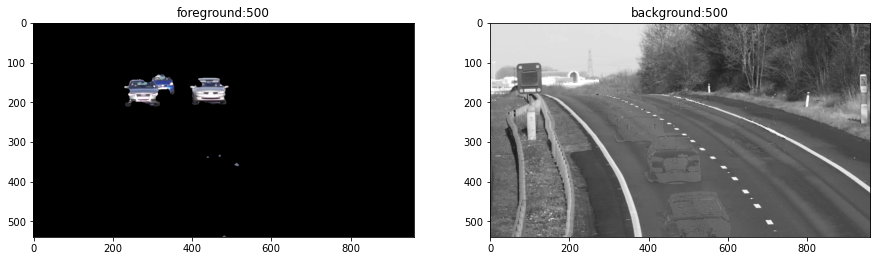

12 13


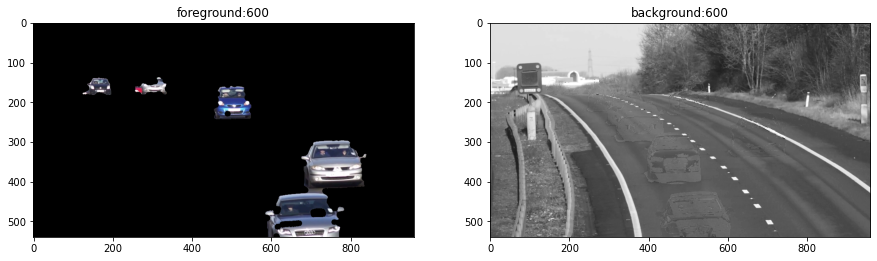

14 15


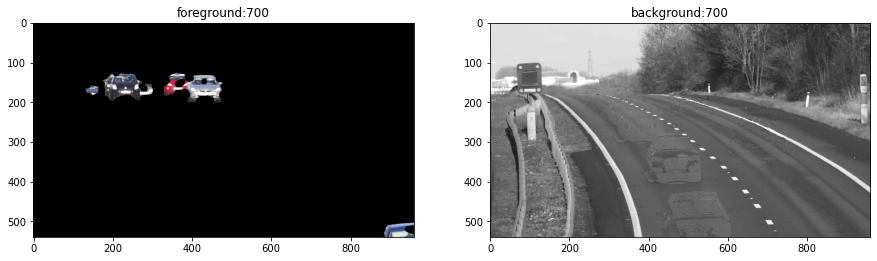

16 17


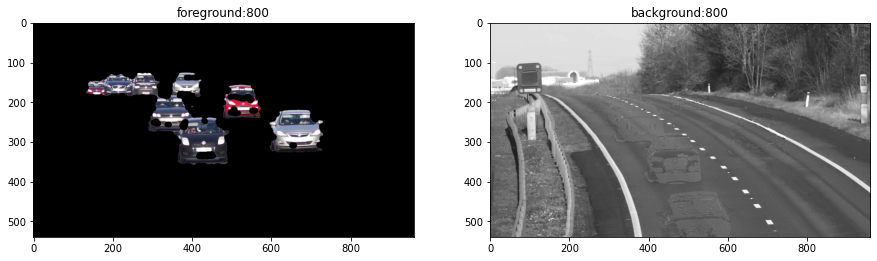

18 19


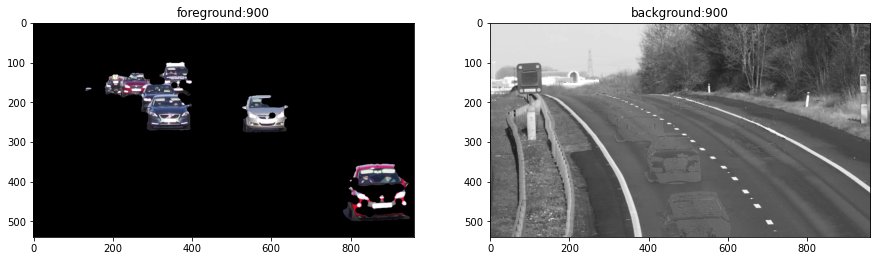

20 21


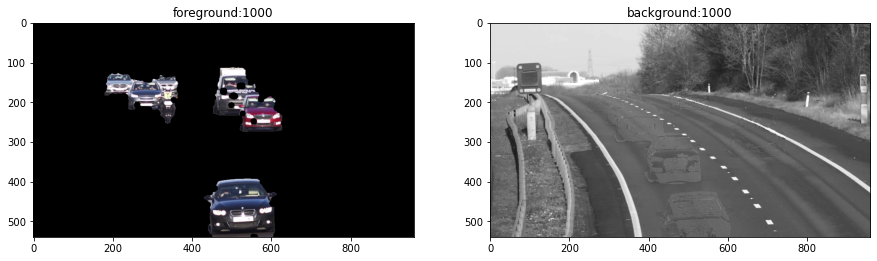

22 23


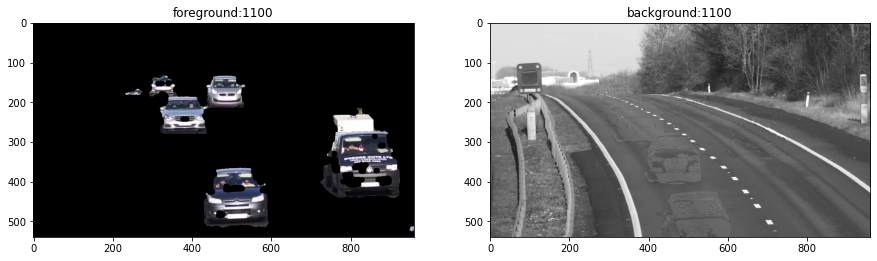

24 25


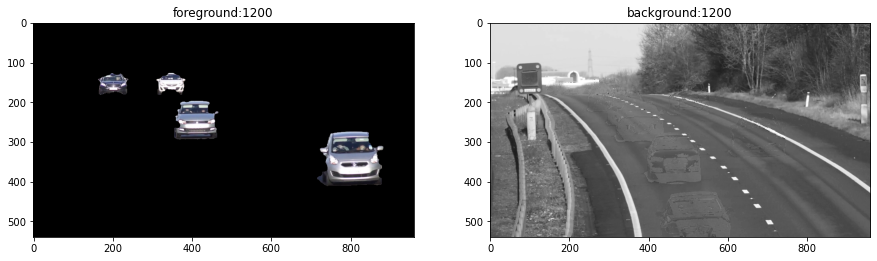

26 27


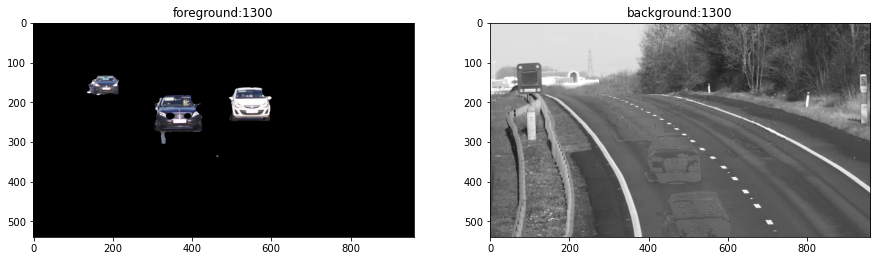

28 29


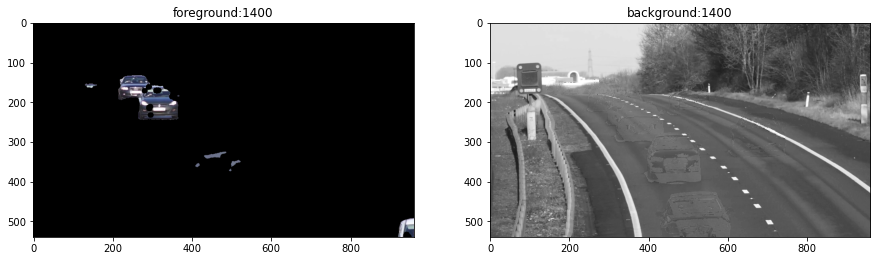

30 31


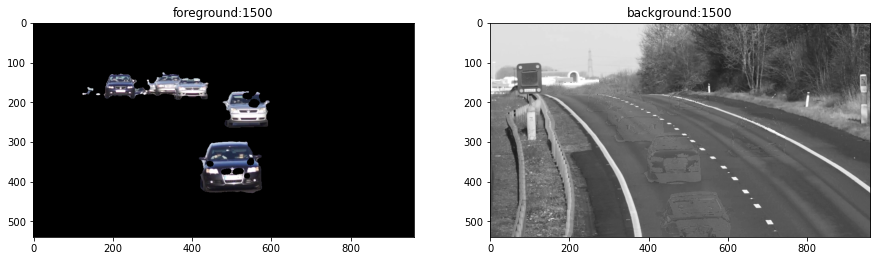

In [6]:
fgbg = cv2.bgsegm.createBackgroundSubtractorCNT()

image_frames = []
split_image_fgbg(fgbg, image_frames, "../data/traffic.mp4", (5,5), (15,15), True)



########################################################
print("createBackgroundSubtractorCNT ==", len(image_frames))
k = 2
for i in range(0,len(image_frames),k):
    print(i,i+k-1)
    plt_view_image(plt,image_frames[i:i+k], figsize=(15,8), axis='on', cmap='gray')

###  Employ the background segmentation technique based on the Nearest Neighbors method:

createBackgroundSubtractorKNN == 32
0 1


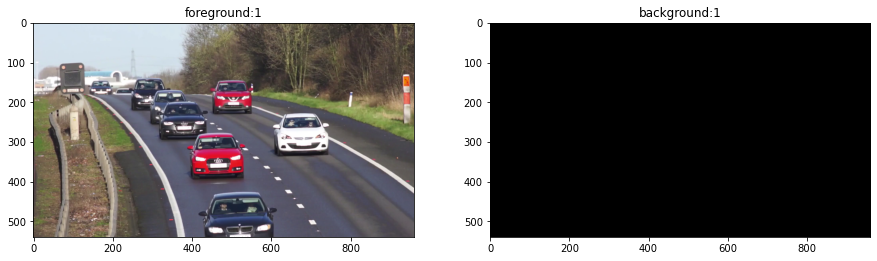

2 3


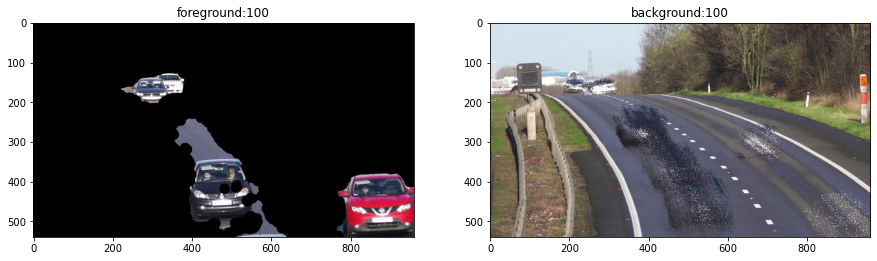

4 5


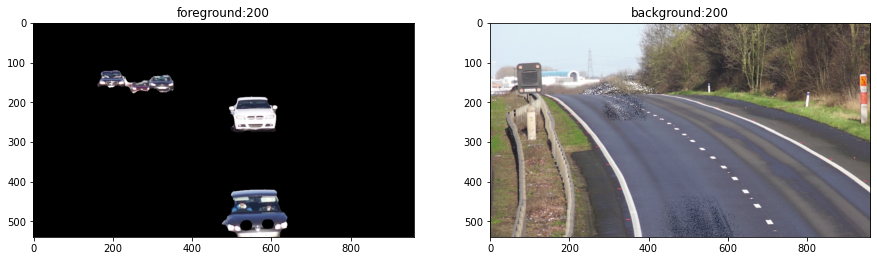

6 7


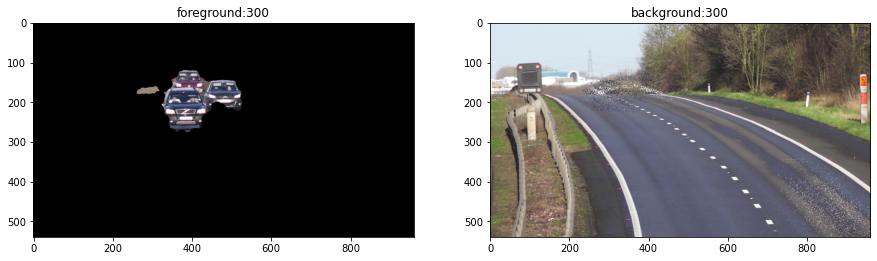

8 9


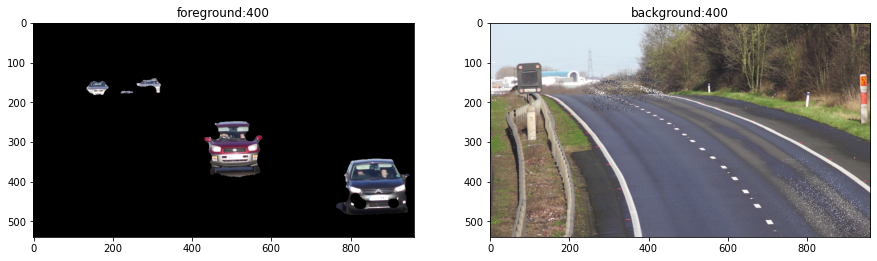

10 11


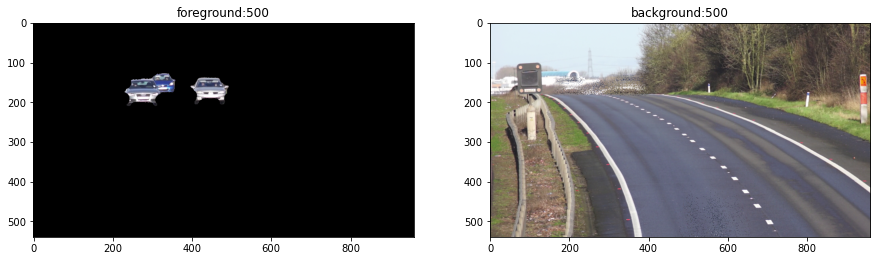

12 13


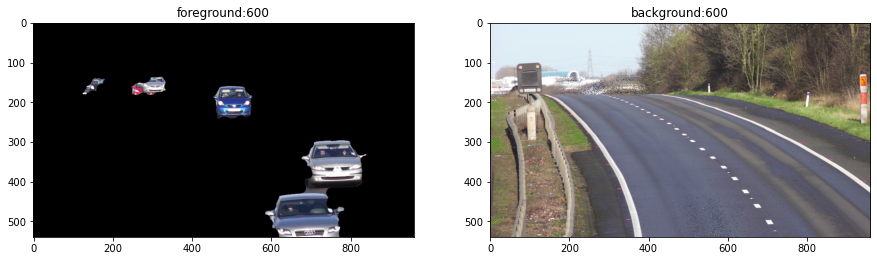

14 15


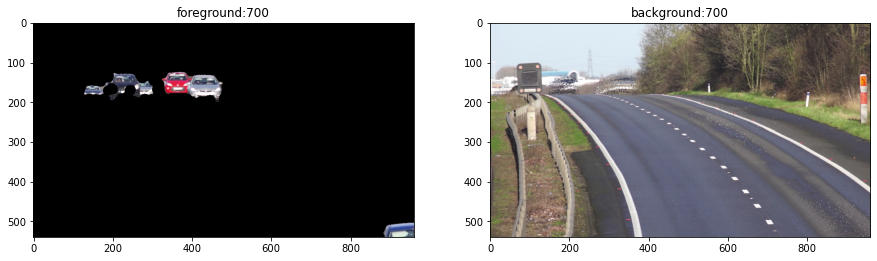

16 17


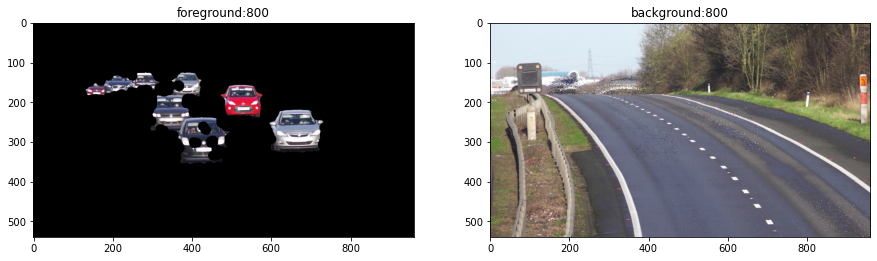

18 19


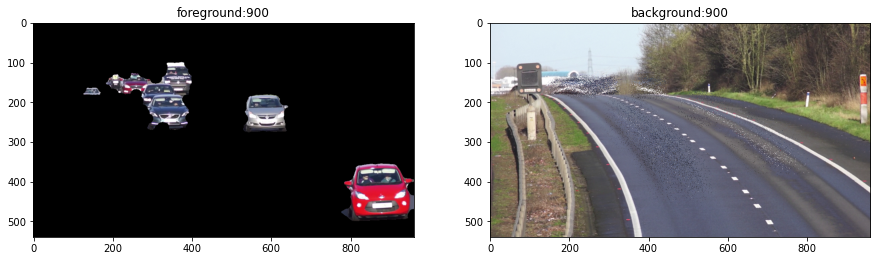

20 21


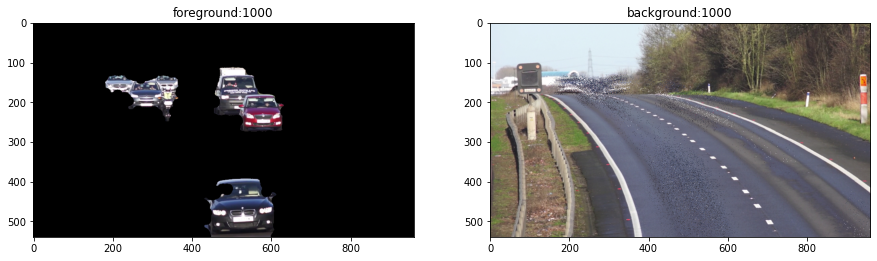

22 23


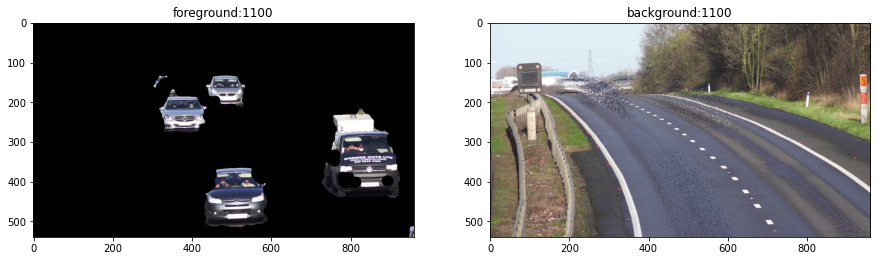

24 25


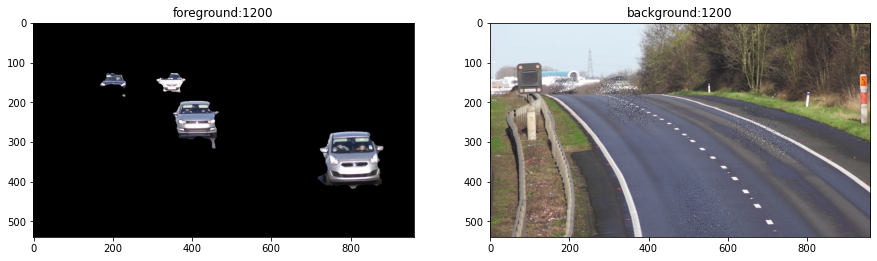

26 27


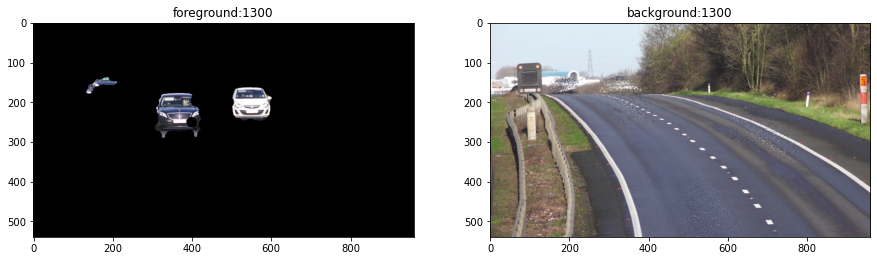

28 29


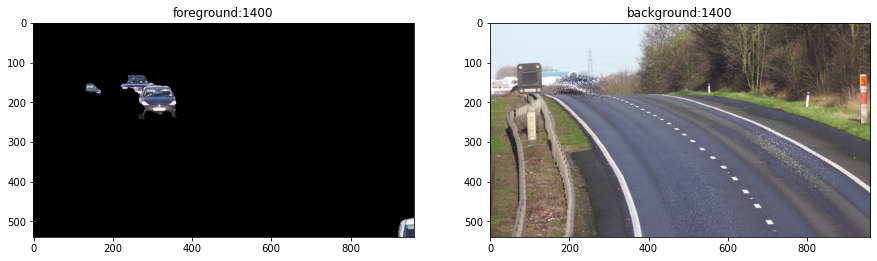

30 31


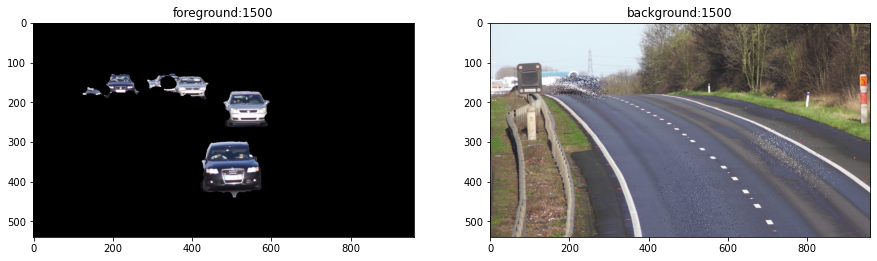

In [7]:
fgbg = cv2.createBackgroundSubtractorKNN()

image_frames = []
split_image_fgbg(fgbg, image_frames, "../data/traffic.mp4", (5,5), (25,25), True)



########################################################
print("createBackgroundSubtractorKNN ==", len(image_frames))
k = 2
for i in range(0,len(image_frames),k):
    print(i,i+k-1)
    plt_view_image(plt,image_frames[i:i+k], figsize=(15,8), axis='on', cmap='gray')